# Домашнее задание 3

1) [1 балл] Реализуйте чтение изображений, лежащих в /data/imgs/arrow (как в демо с калибровкой камеры с семинара). Вся обязательная часть задания выполняется с этими изображениями

2) [2 балла] Реализуйте нахождение расстояния от камеры до листка, учитывая, что это тот же листок, что был в первом демо

3) [3 балла] Реализуйте приведение изображения листка к "виду сверху"

4) [6 баллов] Реализуйте определение направления, в котором указывает стрелка. Можно использовать скелетонизацию из первого семинара по зрению: получить маску темной области (стрелки) внутри изображения листка, применить скелетонизацию, вычислить направление. Можно поступить иначе: после нахождения маски вычислить градиенты Собеля по x и y и проанализировать их направления. P.S. Можно использовать и полностью свой метод

5) [3 балла] Примените написанный Вами код к видео https://drive.google.com/file/d/1AQhg2lL5FL4edlOcxY2SHOOZ-v9TgHBD/view?usp=sharing. Загрузите видео на свой гугл диск, а затем дополните имеющийся код монтированием диска и чтением в цикле кадров видео, приведёнными в конце семинара

6) [5 баллов] Доп. задача: определите, нормально ли видно листок в кадре. На некоторых кадрах его видно не полностью, один или больше уголков находятся за кадром. Это можно автоматически обнаруживать, к примеру используя размеры стрелки, и выводить на соответствующем кадре маркер - текст или цветную метку

## Выполнение:

In [1]:
import numpy as np
import pandas as pd
import scipy as sp
import cv2
import time
import os
import math
import sys
import glob
import sklearn
import matplotlib.pyplot as plt

from scipy import stats
from random import randrange
from math import pi, fabs, sin, cos
from numpy.linalg import inv
from sklearn.linear_model import LinearRegression
from sklearn.cluster import DBSCAN

### 1) Чтение изображений, лежащих в /data/imgs/arrow:  
**[1 балл]**

In [2]:
cd

/home/zhanna


In [3]:
cd jupyter_env/cvr_course/data/imgs

/home/zhanna/jupyter_env/cvr_course/data/imgs


In [4]:
images = [cv2.imread(x,cv2.IMREAD_COLOR) for x in glob.glob('arrow/*.png')] #1 пункт

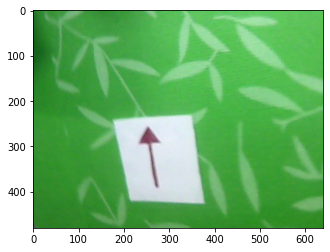

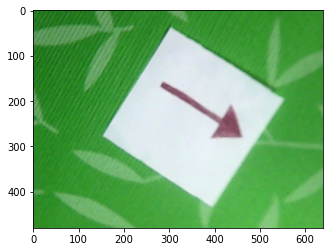

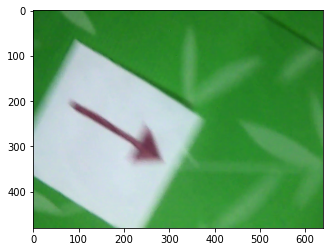

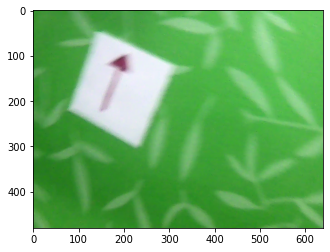

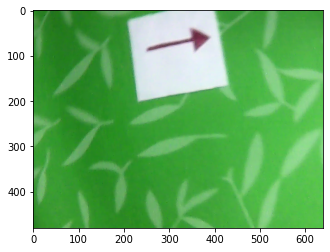

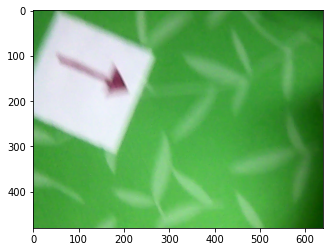

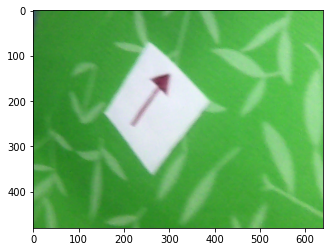

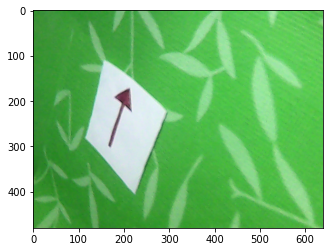

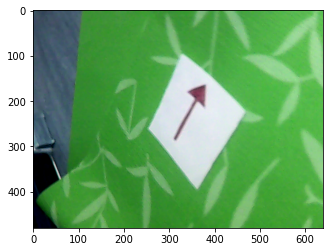

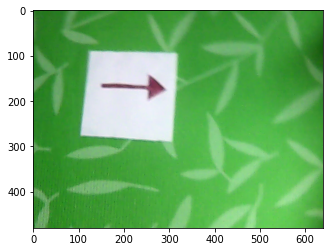

In [5]:
for i in images:
    plt.imshow(i)
    plt.show()

### 2) Нахождение расстояния от камеры до листка, учитывая, что это тот же листок, что был в первом демо.
**[2 балла]**

In [6]:
def find_contour_length1(msk):
    contours, _ = cv2.findContours (msk, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE) 
    max_len=0
    cnt=0
    for contour in contours: 
        len1 = cv2.arcLength(contour,True)
        if len1> max_len:
            max_len=len1
    max_area=0
    cnt=None
    for contour in contours: 
        area = cv2.contourArea(contour)
        if area> max_area:
            max_area=area
            cnt=contour
    len2 = cv2.arcLength(cnt,True)
    
    
    return cnt,(len1+len2)/2

In [7]:
def order_points(pts):
    rect = np.zeros((4, 2), dtype="float32")
    
    s = pts.sum(axis=1)
    rect[0] = pts[np.argmin(s)]
    rect[2] = pts[np.argmax(s)]
  
    diff = np.diff(pts, axis=1)
    rect[1] = pts[np.argmin(diff)]
    rect[3] = pts[np.argmax(diff)]
    return rect

In [8]:
def find_distance (img):
    kernel = np.ones((5, 5), 'uint8')
    img = cv2.dilate(img, kernel)
    low  = (200,  200, 200)
    high = (255, 255, 255)
    img_rgb = cv2.cvtColor (img, cv2.COLOR_BGR2RGB) 
    msk = cv2.inRange(img, low, high)
    contour,length=find_contour_length1(msk)
    
    distance = 180.0*364/cv2.arcLength(contour, True)
    return distance

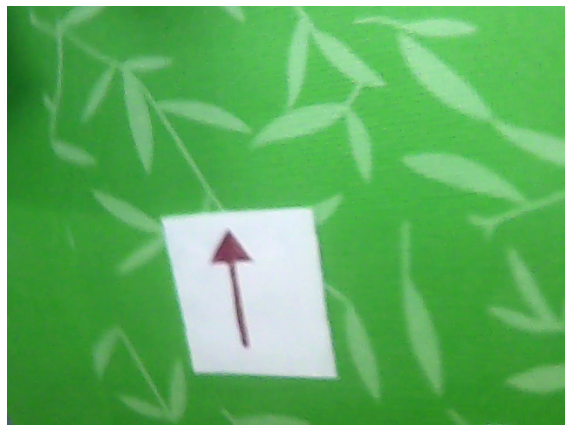

87.46750246224394


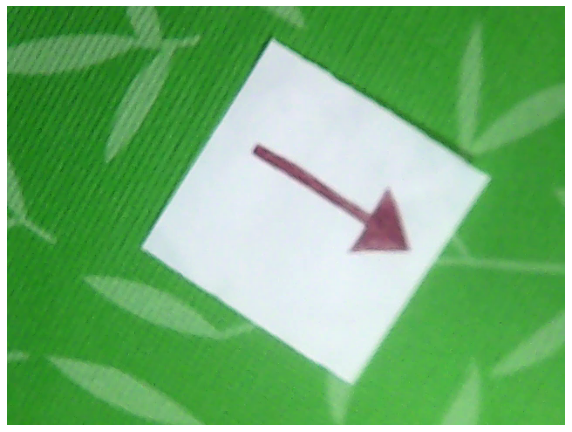

51.397764107508884


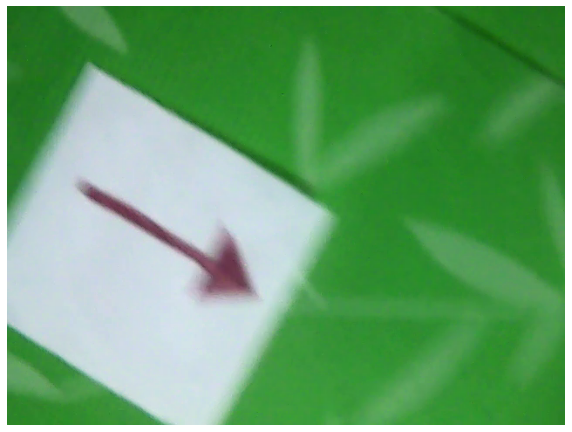

25.53289278135387


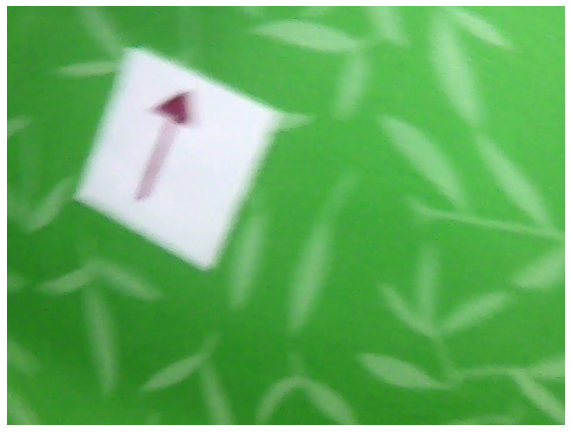

82.44793586042405


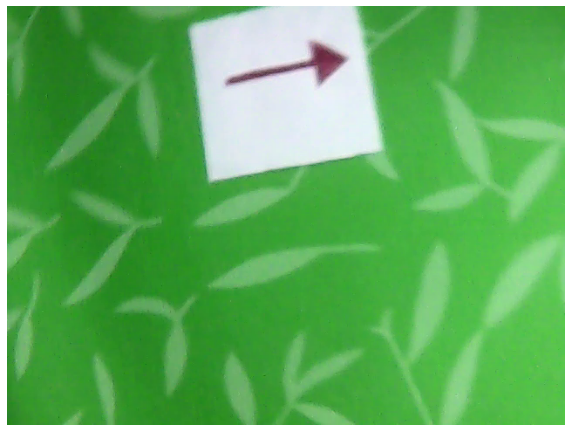

84.02088351844013


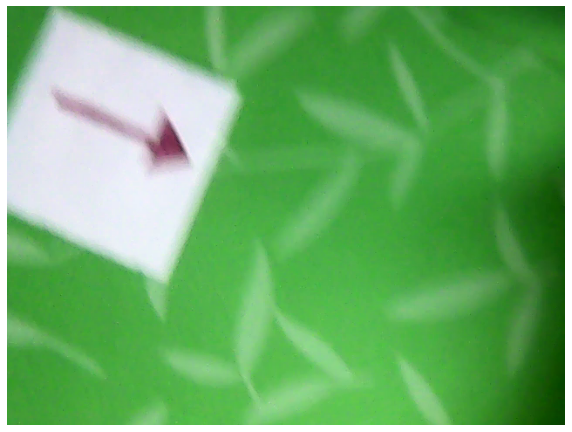

67.23569927023797


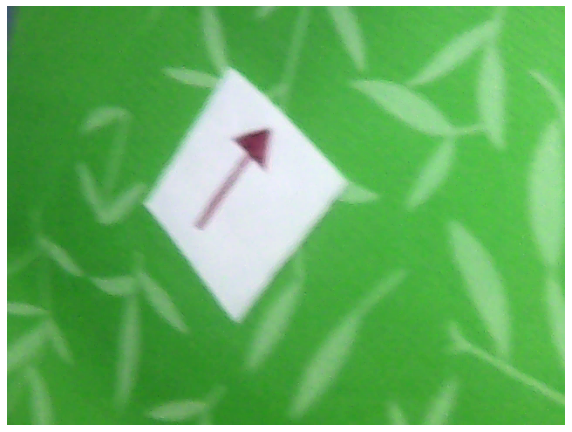

77.02732758179461


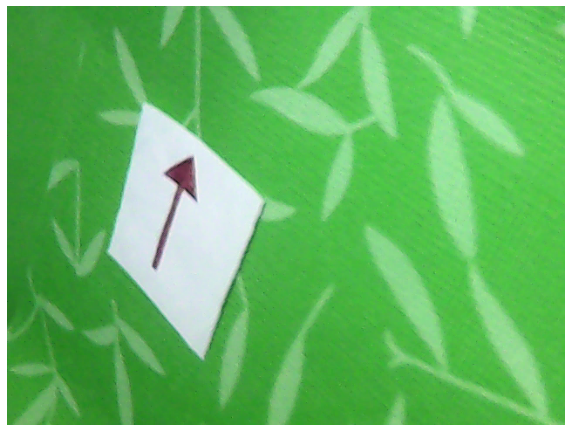

78.65852183323146


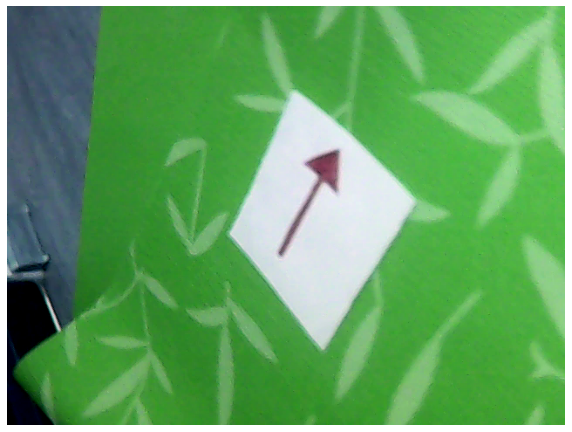

78.32573228429698


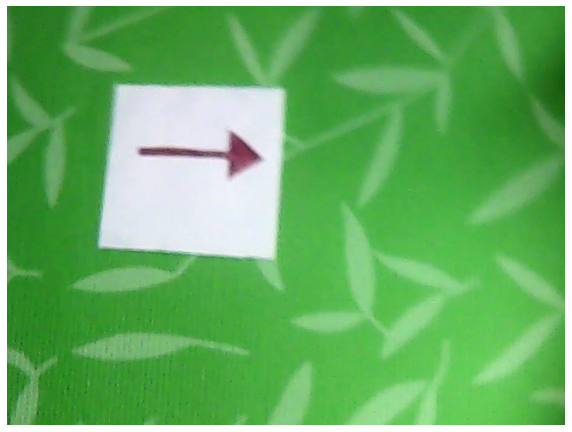

81.8085337194531


In [9]:
for i in images:
    plt.rcParams["figure.figsize"] = (10,10)
    plt.imshow(i)
    plt.axis('off')
    plt.show()
    dist = find_distance(i)
    print(dist)

### 3) Приведение изображения листка к "виду сверху".
**[3 балла]**

In [10]:
def four_point_transform(image, pts):

    (tl, tr, br, bl) = pts

    widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
    widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
    maxWidth = max(int(widthA), int(widthB))

    heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
    heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
    maxHeight = max(int(heightA), int(heightB))

    dst = np.array([
        [0, 0],
        [maxWidth - 1, 0],
        [maxWidth - 1, maxHeight - 1],
        [0, maxHeight - 1]], dtype="float32")

    M = cv2.getPerspectiveTransform(pts, dst)
    warped = cv2.warpPerspective(image, M, (maxWidth, maxHeight))

    return warped

In [11]:
arrows=[]
for i in images:
        low  = (200,  200, 200)
        high = (255, 255, 255)
        img_rgb = cv2.cvtColor (i, cv2.COLOR_BGR2RGB) 
        msk = cv2.inRange(i, low, high)
        contour,length=find_contour_length1(msk)
        cnt=order_points(np.asarray(contour[:,0,:]))

        arrows.append(four_point_transform(i,cnt))

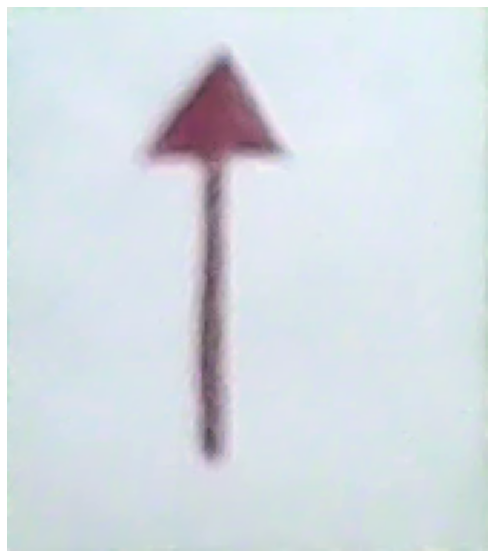

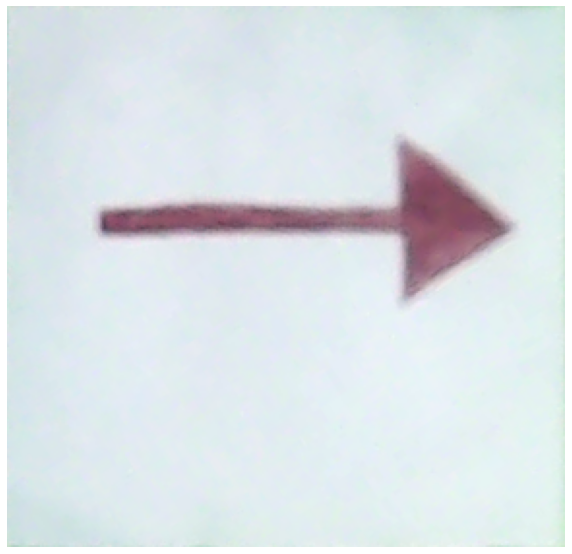

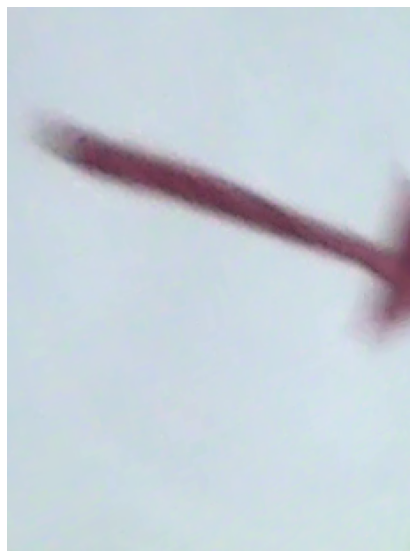

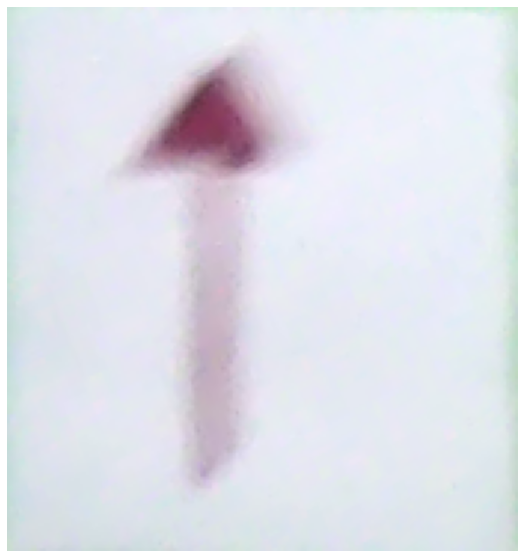

In [12]:
for i in range(4):
    plt.rcParams["figure.figsize"] = (10,10)
    plt.imshow(arrows[i])
    plt.axis('off')
    plt.show()

### 4) Определение направления, в котором указывает стрелка. 
**[6 баллов]**

In [13]:
def find_contour_length(msk):
    max1=0
    contours, _ = cv2.findContours (msk, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE) 
    for contour in contours: 
        area = np.max((cv2.contourArea(contour),1000))

        perimeter=cv2.arcLength(contour, True)
        if perimeter/area> max1:
            max1=perimeter/area
            cnt=contour
    
    cnt = cv2.convexHull (cnt)
    epsilon = 0.05 * cv2.arcLength (cnt, True)
    cnt = cv2.approxPolyDP (cnt, epsilon, True)
    length = cv2.arcLength (cnt, True)
    
    return cnt,length

In [14]:
def get_direction_by_four_points(warped):

    low  = (0,  200, 0)
    high = (255, 255, 255)
    msk = cv2.inRange(warped, low, high)
    cnt,_=find_contour_length(msk)

    A=cnt[0][0]
    B=cnt[1][0]
    C=cnt[2][0]
    D=cnt[3][0]
    if (A[0]-B[0])**2+(A[1]-B[1])**2<(C[0]-D[0])**2+(C[1]-D[1])**2:
        A,C=C,A
        B,D=D,B
    if (A[0]-C[0])**2+(A[1]-C[1])**2<(B[0]-D[0])**2+(B[1]-D[1])**2:
        A,D=D,A
    l=(A[0]-B[0])**2+(A[1]-B[1])**2
    if (A[0]-C[0])**2+(A[1]-C[1])**2>(A[0]-B[0])**2+(A[1]-B[1])**2:
        B,C=C,B
        l=(A[0]-B[0])**2+(A[1]-B[1])**2
    if (A[0]-D[0])**2+(A[1]-D[1])**2>(A[0]-B[0])**2+(A[1]-B[1])**2:
        B,D=D,B
    if np.abs(B[0]-A[0])<np.abs(B[1]-A[1]):
        if B[1]-A[1]>0:
            print("Points to down")
        else:
            print("Points to top")
    elif (np.abs(B[0]-A[0])>=np.abs(B[1]-A[1])):
        if B[0]-A[0]>0:
            print("Point to right")
        else:
            print("Points to left")


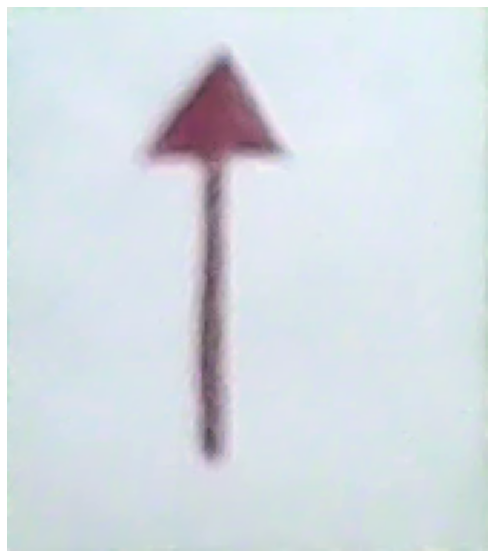

Points to top


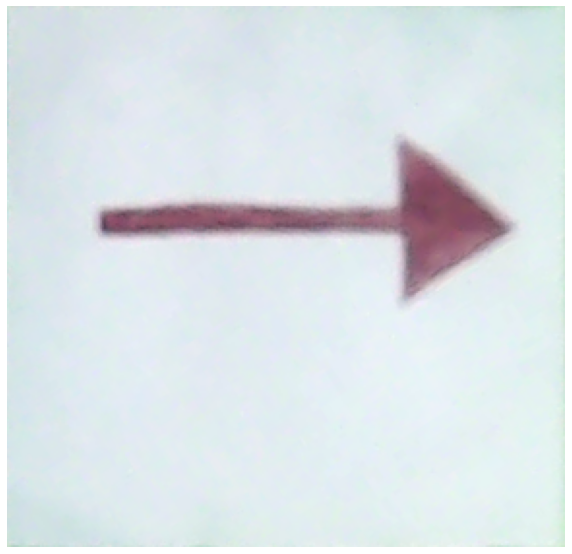

Point to right


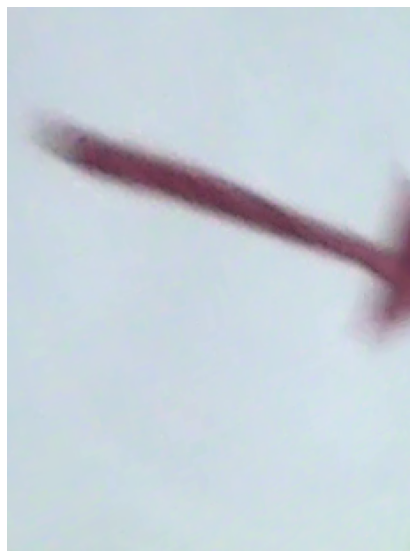

Points to down


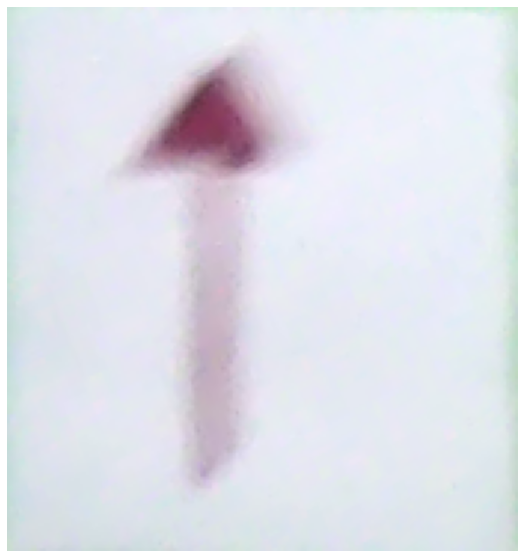

Points to top


In [15]:
for i in range(4):
    plt.rcParams["figure.figsize"] = (10,10)
    plt.imshow(arrows[i])
    plt.axis('off')
    plt.show()
    get_direction_by_four_points(arrows[i])

### 5) Применение кода к видео https://drive.google.com/file/d/1AQhg2lL5FL4edlOcxY2SHOOZ-v9TgHBD/view?usp=sharing. 
**[3 балла]**

In [1]:
from google.colab import drive
from google.colab.patches import cv2_imshow
from IPython.display import display, clear_output
drive.mount('/content/drive/', force_remount=False)


Mounted at /content/drive/


97.6122269744106


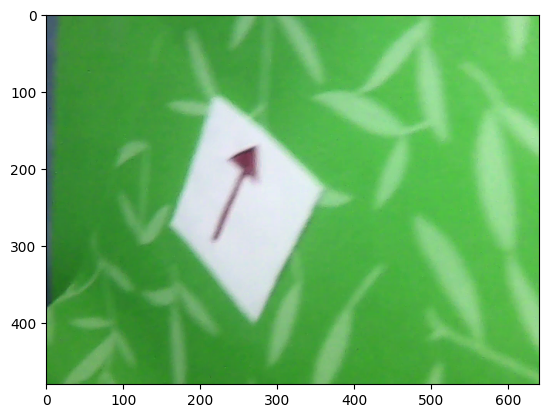

91.95728030188943


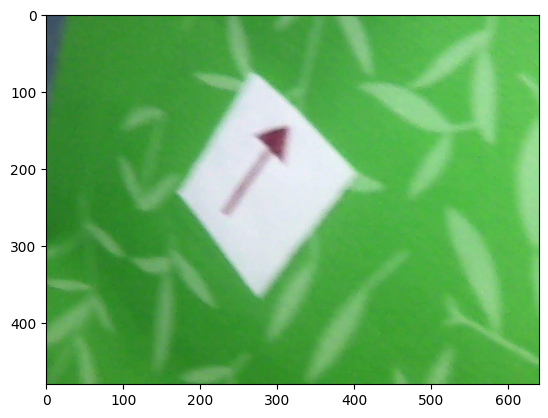

90.84566645485869


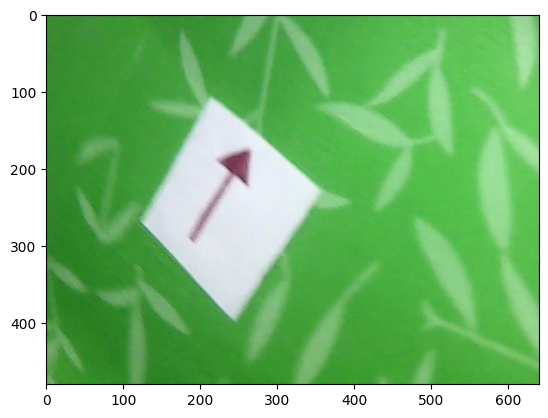

95.49293120989566


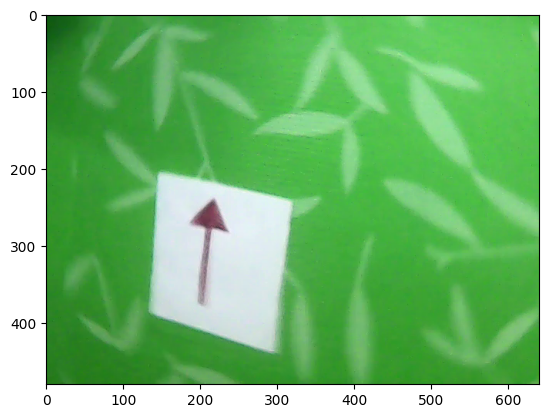

98.98580324454126


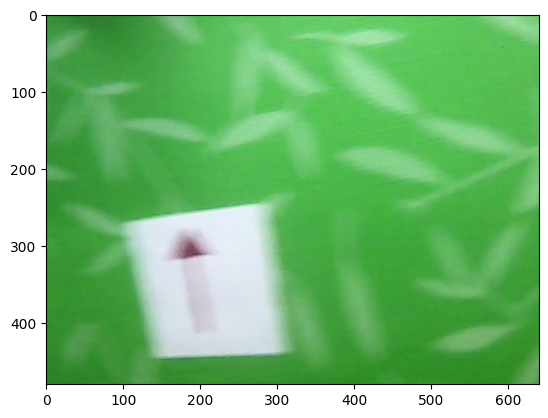

104.35364198795652


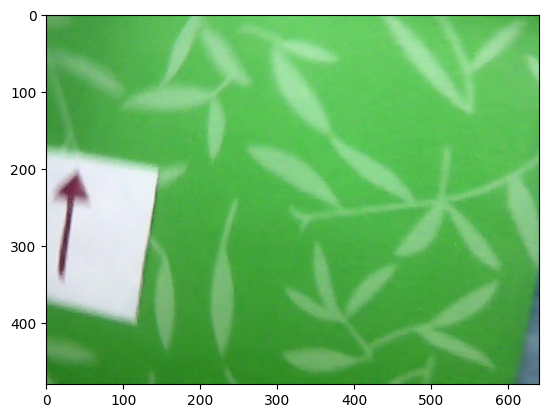

93.08624530172752


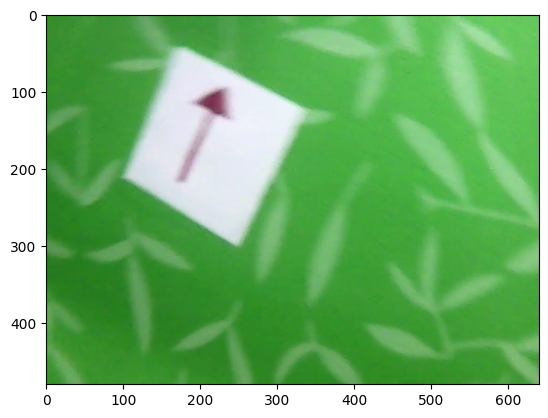

91.17274274926227


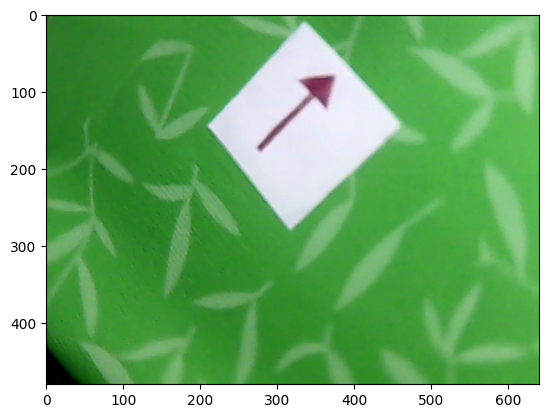

90.9185843179116


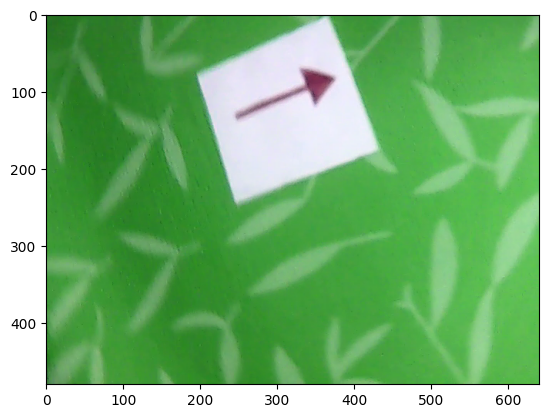

88.89147724719123


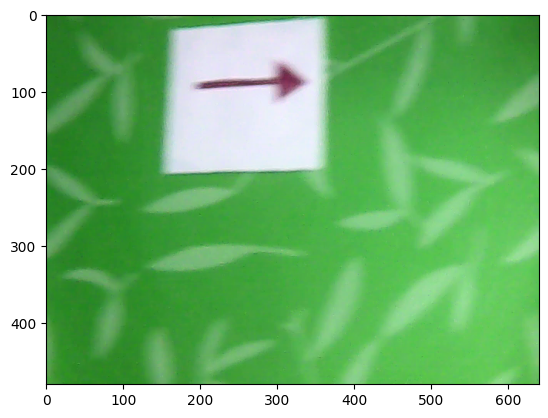

In [2]:
cap = cv2.VideoCapture('/content/drive/MyDrive/3.mov')
i=0
while(cap.isOpened() and i <= 100):
    i += 1
    ret, frame = cap.read()
    if (i % 10 != 0):
        continue
    try:
        dist = find_distance(frame)
        print(dist)
        plt.imshow(frame)
        plt.show()
    except:
        print("Bad moment")
cap.release()
